In [ ]:
import numpy as np
import torch 
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np 
import math 
from skimage.io import imread, imshow
import os

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
path_data = '/content/gdrive/MyDrive/AprendizajeAutomatico/Proyecto4/autoencoder/dataset/'

In [ ]:
path_val_low  = path_data + 'val/low_res'
path_val_high = path_data + 'val/high_res'
path_test_low = path_data + 'train/low_res'
path_test_high= path_data + 'train/high_res'
#path_raw_low  = path_data + 'RawData/low_res'
#path_raw_high = path_data + 'RawData/high_res'

In [ ]:
import random
val_datos = 170
train_datos = 1370
n_test = int(val_datos*0.30)
#test_list1 = random.sample(range(val_datos), n_test)
#val_list1 = random.sample(range(val_datos), n_test)
random_list = random.sample(range(val_datos), val_datos)
test_list_h = random_list[:n_test]
val_list_h = random_list[n_test:]
test_list_l = list(map(lambda x: x + val_datos, test_list_h))
val_list_l = list(map(lambda x: x + val_datos, val_list_h))

In [ ]:
import functools 
print(len(random_list), len(test_list_h), len(val_list_h))
print(np.array(test_list_h).reshape(len(test_list_h)))
print(np.array(val_list_h).reshape(len(val_list_h)))
print(np.array(test_list_l).reshape(len(test_list_l)))
print(np.array(val_list_l).reshape(len(val_list_l)))

if functools.reduce(lambda x, y : x and y, map(lambda p, q: p == q,test_list_h,val_list_h), True): 
    print ("The lists l1 and l2 are the same") 
else: 
    print ("The lists l1 and l2 are not the same") 

if functools.reduce(lambda x, y : x and y, map(lambda p, q: p == q,test_list_l,val_list_l), True): 
    print ("The lists l1 and l2 are the same") 
else: 
    print ("The lists l1 and l2 are not the same") 

170 51 119
[ 10 144 111  32  90 141 134 110 114  60  30 133 164  15 101  24  67 136
 145 163  12  87  16  82 117  55 112 121 126  41 106 104 109 103  66 122
  43  71 135 108 118  13  94   6   1  64   5   4  33  34  74]
[ 11 162 138  68  25 158  45  84  39  59 140 150  51  14  50  61  81 137
 165 146  97  28  65  93   7  29  54  63  47  73  98  96  35  88  76 167
   3 169  49 155 119 123 102  70 113 128  46 127 159 151 142  89 124  19
 157 168 125 160 139   0 120 153 116  56  53  92  18  83  69   8  86 132
 107 161 105   2  78  52  48  72  77  26  38  62  91   9  22 148 129 143
  75  36  58 100 115  80  27  23  20 154  44 149  95  40  37 130 166  17
  79 152  57  99  85 156  31  21  42 131 147]
[180 314 281 202 260 311 304 280 284 230 200 303 334 185 271 194 237 306
 315 333 182 257 186 252 287 225 282 291 296 211 276 274 279 273 236 292
 213 241 305 278 288 183 264 176 171 234 175 174 203 204 244]
[181 332 308 238 195 328 215 254 209 229 310 320 221 184 220 231 251 307
 335 316 267 198

In [ ]:
path_val  = path_data + 'val/'
path_train = path_data + 'train/'
#path_raw  = path_data + 'RawData/'

In [ ]:
img_val = torchvision.datasets.ImageFolder(root=path_val, transform = transforms.ToTensor())
img_train = torchvision.datasets.ImageFolder(root=path_train, transform = transforms.ToTensor())

In [ ]:
print(img_val.classes)
print(img_train.classes)
print(len(img_val))
print(len(img_train))

['high_res', 'low_res']
['high_res', 'low_res']
340
1370


In [ ]:
x1,y1 = img_val[0]
x2,y2 = img_val[171]
print(y1,y2)

0 1


In [ ]:
import torch.utils.data as data_utils

#val_datos = 170
#train_datos = 1370

img_val_high = data_utils.Subset(img_val, val_list_h)
img_val_low = data_utils.Subset(img_val, val_list_l)

img_test_high = data_utils.Subset(img_val, test_list_h)
img_test_low = data_utils.Subset(img_val, test_list_l)

indices = torch.arange(0,int(train_datos/2 -1))
img_train_high = data_utils.Subset(img_train, indices)
indices = torch.arange(int(train_datos/2),train_datos -1)
img_train_low = data_utils.Subset(img_train, indices)

In [ ]:
def Show_imgs(imgs, name,  size = 3, color = True):
  color_m ='jet'
  if color == False:
    color_m ='gray'
  print('******************' + name  +  '**************************')
  img_numbers = imgs.shape[0]
  rows = cols = math.ceil(np.sqrt(img_numbers))
  
  fig = plt.figure(figsize=(rows*size, cols*size))
  
  for i in range(0, rows*cols):
    fig.add_subplot(rows, cols,i+1)
    if i<img_numbers:
      #plt.imshow(imgs[i].detach(), cmap = 'gray')
      plt.imshow(imgs[i].detach())
      #interpolation=NONE
  plt.show()

******************0**************************


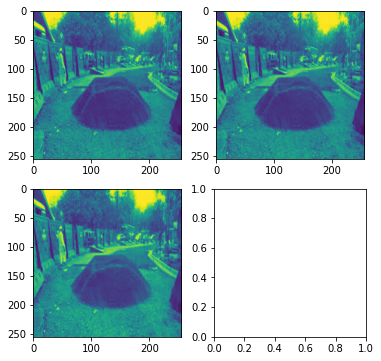

******************1**************************


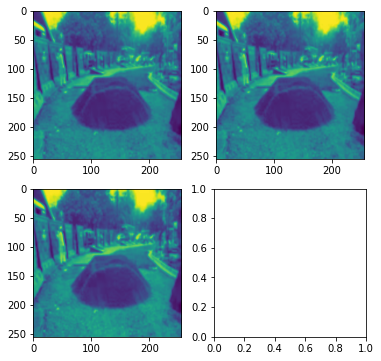

In [ ]:
img, label = img_val_high[16]
Show_imgs(img, str(label))
img, label = img_val_low[16]
Show_imgs(img, str(label))

******************0**************************


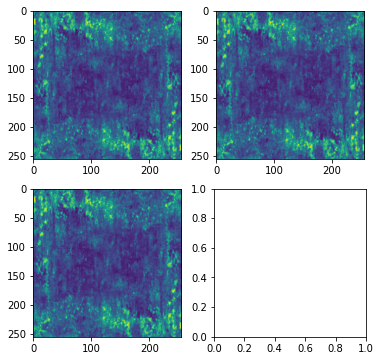

******************1**************************


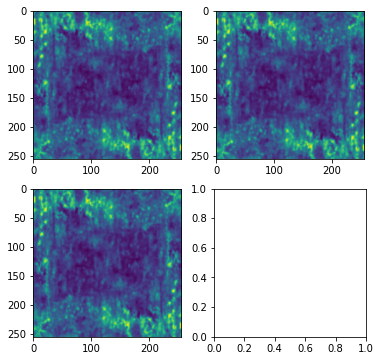

In [ ]:
img, label = img_test_high[16]
Show_imgs(img, str(label))
img, label = img_test_low[16]
Show_imgs(img, str(label))

******************0**************************


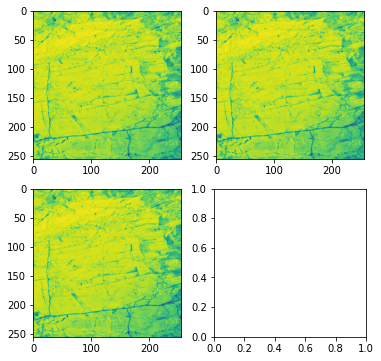

******************1**************************


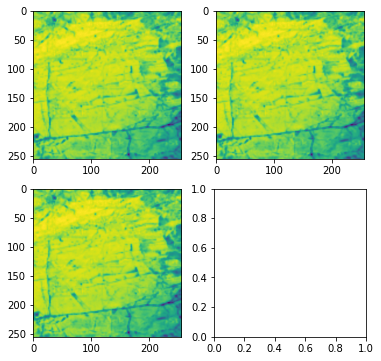

In [ ]:
img, label = img_train_high[16]
Show_imgs(img, str(label))
img, label = img_train_low[16]
Show_imgs(img, str(label))

In [ ]:
print(len(img_val_low))
print(len(img_val_high))
print(len(img_test_low))
print(len(img_test_high))
print(len(img_train_low))
print(len(img_train_high))

119
119
51
51
684
684


In [ ]:
img_val
#img_val_low

Dataset ImageFolder
    Number of datapoints: 340
    Root location: /content/gdrive/MyDrive/AprendizajeAutomatico/Proyecto4/autoencoder/dataset/val/
    StandardTransform
Transform: ToTensor()

In [ ]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transform
import torch.nn.functional as F

import matplotlib.pyplot as plt
import numpy as np
import math


device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

batch_size = 16

img_transform = transform.Compose([transform.ToTensor(), transform.Normalize((0.5,),(0.5,))]) 

train_set = img_train
test_set = img_val

img, _ = train_set[0]
print(img.shape)

val_loader_lowres = torch.utils.data.DataLoader(dataset=img_val_low, batch_size=batch_size, shuffle=False)
val_loader_highres = torch.utils.data.DataLoader(dataset=img_val_high, batch_size=batch_size, shuffle=False)

test_loader_lowres = torch.utils.data.DataLoader(dataset=img_test_low, batch_size=batch_size, shuffle=False)
test_loader_highres = torch.utils.data.DataLoader(dataset=img_test_high, batch_size=batch_size, shuffle=False)

train_loader_lowres = torch.utils.data.DataLoader(dataset=img_train_low, batch_size=batch_size, shuffle=False)
train_loader_highres = torch.utils.data.DataLoader(dataset=img_train_high, batch_size=batch_size, shuffle=False)



cuda:0
torch.Size([3, 256, 256])


In [ ]:
class Encoder(nn.Module):
  def __init__(self):
    super(Encoder, self).__init__()
    #256x256
    self.conv11 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride = 1,padding=0)
    self.conv12 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride = 1,padding=2)
    self.mpool1 = nn.MaxPool2d(kernel_size=2, stride=2)
    #128x128
    self.conv21 = nn.Conv2d(in_channels=64, out_channels=64*2, kernel_size=3, stride = 1,padding=0)
    self.conv22 = nn.Conv2d(in_channels=64*2, out_channels=64*2, kernel_size=3, stride = 1,padding=2)
    self.mpool2 = nn.MaxPool2d(kernel_size=2, stride=2)
    #64x64
    self.conv31 = nn.Conv2d(in_channels=64*2, out_channels=64*4, kernel_size=3, stride = 1,padding=0)
    self.conv32 = nn.Conv2d(in_channels=64*4, out_channels=64*4, kernel_size=3, stride = 1,padding=2)
    self.mpool3 = nn.MaxPool2d(kernel_size=2, stride=2)
    #32x32    
    self.conv41 = nn.Conv2d(in_channels=64*4, out_channels=64*8, kernel_size=3, stride = 1,padding=1)

  def forward(self, image):
    capas = []
    out = F.relu(self.conv11(image))
    out = F.relu(self.conv12(out))
    capas.append(out)
    out = self.mpool1(out)
    out = F.relu(self.conv21(out))
    out = F.relu(self.conv22(out))
    capas.append(out)
    out = self.mpool2(out)
    out = F.relu(self.conv31(out))
    out = F.relu(self.conv32(out))
    capas.append(out)
    out = self.mpool3(out)
    out = F.relu(self.conv41(out))
    z=out
    return z, capas

class Decoder(nn.Module):
  def __init__(self):
    super(Decoder, self).__init__()
    self.conv22 = nn.Conv2d(in_channels=8*64, out_channels=64*8, kernel_size=3, stride = 1,padding=1)
    self.convTran2 = nn.ConvTranspose2d(in_channels=8*64,out_channels=64*4, kernel_size=2, stride=2, padding=0)
    self.conv31 = nn.Conv2d(in_channels=8*64, out_channels=64*4, kernel_size=3, stride = 1,padding=2)
    self.conv32 = nn.Conv2d(in_channels=4*64, out_channels=64*4, kernel_size=3, stride = 1,padding=0)
    self.convTran3 = nn.ConvTranspose2d(in_channels=4*64,out_channels=64*2, kernel_size=2, stride=2, padding=0)
    self.conv41 = nn.Conv2d(in_channels=4*64, out_channels=64*2, kernel_size=3, stride = 1,padding=2)
    self.conv42 = nn.Conv2d(in_channels=2*64, out_channels=64*2, kernel_size=3, stride = 1,padding=0)
    self.convTran4 = nn.ConvTranspose2d(in_channels=2*64,out_channels=64, kernel_size=2, stride=2, padding=0)
    self.conv51 = nn.Conv2d(in_channels=2*64, out_channels=64, kernel_size=3, stride = 1,padding=2)
    self.conv52 = nn.Conv2d(in_channels=64, out_channels=3, kernel_size=3, stride = 1,padding=0)
    
   
  def forward(self, latent, capas):
    out = F.relu(self.conv22(latent))
    #print(out.size(), capas[1].size())
    out = F.relu(self.convTran2(out))
    out = torch.cat((out,capas[2]), dim=1)
    out = F.relu(self.conv31(out))
    out = F.relu(self.conv32(out))
    #print(out.size())
    out = F.relu(self.convTran3(out))
    out = torch.cat((out,capas[1]), dim=1)
    out = F.relu(self.conv41(out))
    out = F.relu(self.conv42(out))
    #print(out.size())
    out = F.relu(self.convTran4(out))
    out = torch.cat((out,capas[0]), dim=1)
    out = F.relu(self.conv51(out))
    out = F.relu(self.conv52(out))
    #print(out.size())
    return out



In [ ]:
class Autoencoder(nn.Module):
   def __init__(self):
        super(Autoencoder, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()

   def forward(self, x):
        latent, capas = self.encoder(x)
        x_recon = self.decoder(latent, capas)
        return  x_recon

In [ ]:
def validation(model, device, val_loader_lowres,val_loader_highres, loss_function):    
    model.eval()
    loss_total = 0    
    with torch.no_grad():
        #for i, (images, labels) in enumerate(val_loader):
        for item1, item2 in zip(val_loader_lowres, cycle(val_loader_highres)):
            images, _ = item1
            labels, _ = item2
            #inputs = images.float().to(device)
            #labels = labels.long().to(device)
            #outputs = model(inputs).float()
            inputs = images.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            loss = loss_function(outputs, labels)
            loss_total += loss.item()
    return loss_total / len(val_loader_lowres)

In [ ]:
def psnr(label, outputs, max_val=1.):
    label = label.cpu().detach().numpy() 
    outputs = outputs.cpu().detach().numpy()
    img_diff = outputs - label
    rmse = math.sqrt(np.mean((img_diff) ** 2))
    if rmse == 0:
        return 100
    else:
        PSNR = 20 * math.log10(max_val / rmse)
        return PSNR

In [ ]:
from itertools import cycle

def train(model, train_loader_lowres, train_loader_highres, Epochs, loss_fn):
    ultimo_loss = 100
    umbral_loss = 3
    times = 0  
    train_loss_avg = []
    list_loss= []
    train_list=[]
    val_list=[] 
    train_psnr = []
    for epoch in range(Epochs):
      train_loss_avg.append(0)
      num_batches = 0
      train_loss = 0  
      running_psnr = 0.0
      for item1, item2 in zip(train_loader_lowres, cycle(train_loader_highres)):
          image_batch, _ = item1
          image_compare, _ = item2

          image_batch = image_batch.to(device)
          image_compare = image_compare.to(device)
          
          image_batch_recon = model(image_batch)
          loss = loss_fn(image_batch_recon, image_compare)
          
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
          
          train_loss_avg[-1] += loss.item()
          num_batches += 1
          train_loss += loss.item()

          batch_psnr =  psnr(image_compare, image_batch_recon)
          running_psnr += batch_psnr


      train_list.append(train_loss/len(train_loader_lowres))
      loss_actual = validation(model, device, val_loader_lowres, val_loader_highres, loss_fn)
      val_list.append(loss_actual)

      final_psnr = running_psnr/int(len(train_loader_lowres))
      train_psnr.append(final_psnr)
          
      train_loss_avg[-1] /= num_batches
      print('PSNR [%d / %d] ratio high quality vs train outcome: %f' % (epoch+1, Epochs, train_psnr[-1]))
      print('Epoch [%d / %d] average reconstruction error: %f' % (epoch+1, Epochs, train_loss_avg[-1]))
    print('Final de train con epochs')
    return train_list, val_list, train_psnr
    #return train_loss_avg

In [ ]:
capacity = 64
latent_dims = 10    
learning_rate = 0.001
autoencoder = Autoencoder()
autoencoder.to(device)
loss = nn.MSELoss()
optimizer = torch.optim.Adam(params=autoencoder.parameters(), lr=learning_rate, weight_decay=1e-5)

autoencoder.train()

#loss_result = train(autoencoder,train_loader,10,loss)
loss_train, loss_val, train_psnr = train(autoencoder,train_loader_lowres, train_loader_highres, 20, loss)

PSNR [1 / 20] ratio high quality vs train outcome: 16.927936
Epoch [1 / 20] average reconstruction error: 0.042301
PSNR [2 / 20] ratio high quality vs train outcome: 24.524955
Epoch [2 / 20] average reconstruction error: 0.003729
PSNR [3 / 20] ratio high quality vs train outcome: 27.492807
Epoch [3 / 20] average reconstruction error: 0.001811
PSNR [4 / 20] ratio high quality vs train outcome: 28.115450
Epoch [4 / 20] average reconstruction error: 0.001565
PSNR [5 / 20] ratio high quality vs train outcome: 28.510648
Epoch [5 / 20] average reconstruction error: 0.001430
PSNR [6 / 20] ratio high quality vs train outcome: 28.631199
Epoch [6 / 20] average reconstruction error: 0.001404
PSNR [7 / 20] ratio high quality vs train outcome: 28.822776
Epoch [7 / 20] average reconstruction error: 0.001336
PSNR [8 / 20] ratio high quality vs train outcome: 29.152401
Epoch [8 / 20] average reconstruction error: 0.001235
PSNR [9 / 20] ratio high quality vs train outcome: 29.249770
Epoch [9 / 20] aver

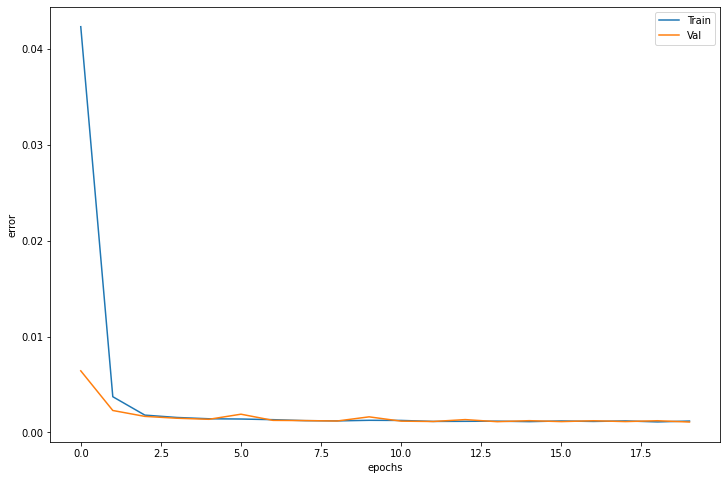

In [ ]:
import matplotlib.pyplot as plt
f = plt.figure()
f.set_figwidth(12)
f.set_figheight(8)
plt.plot(loss_train)
plt.plot(loss_val)
plt.xlabel("epochs")
plt.ylabel("error")
plt.legend(["Train", "Val"], loc ="upper right")
plt.show()

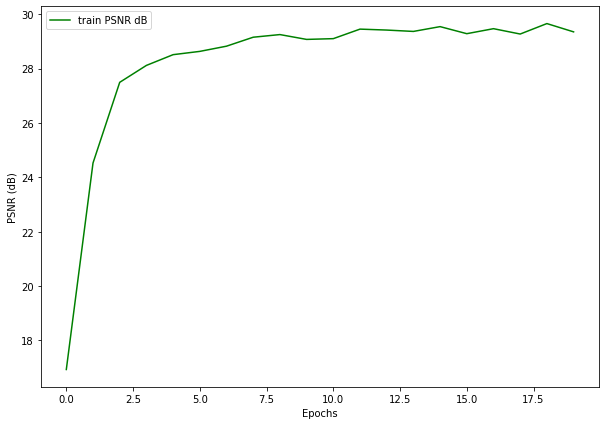

In [ ]:
# psnr plots
plt.figure(figsize=(10, 7))
plt.plot(train_psnr, color='green', label='train PSNR dB')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.legend()
plt.show()

In [ ]:
def Show(out, title = ''):
  print(title)
  out = out.permute(1,0,2,3)
  grilla = torchvision.utils.make_grid(out,10,5)
  plt.imshow(transforms.ToPILImage()(grilla), 'jet')
  plt.show()

def Show_Weight(out, title):
  grilla = torchvision.utils.make_grid(out)
  plt.imshow(transform.ToPILImage()(grilla), 'jet')
  plt.title(title)
  plt.show()

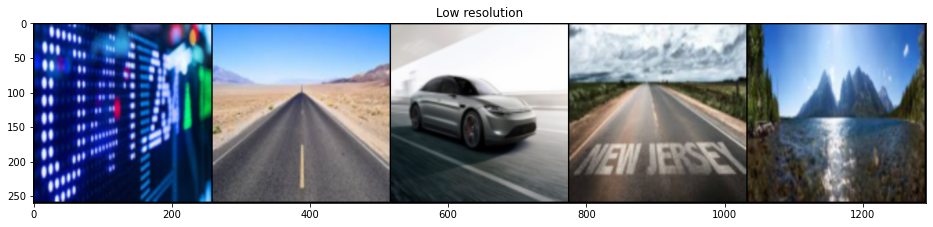

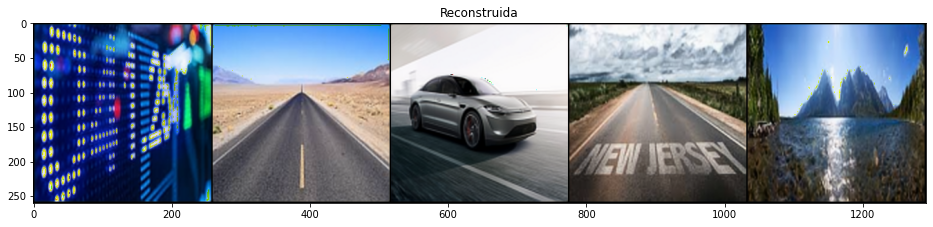

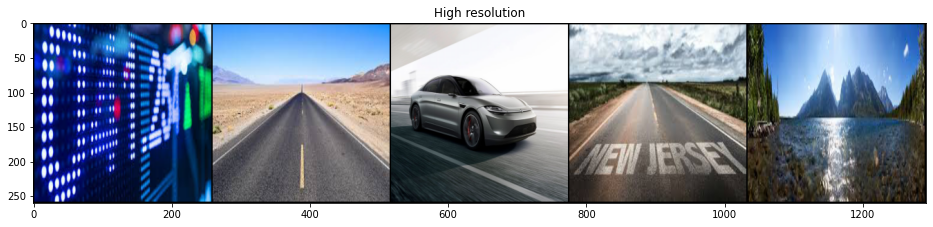

In [ ]:
autoencoder.eval()


tensor = torch.zeros(len(test_loader_lowres),10)


with torch.no_grad():

  #image,label = iter(test_loader).next()
  #image,label = iter(test_loader).next()
  image,label = iter(test_loader_lowres).next()
  image1,label1 = iter(test_loader_highres).next()
  image = image.to(device)
  z,capas = autoencoder.encoder(image)
  z = z.to('cpu')
  z1=z.to(device)
  decodificado = autoencoder.decoder(z1, capas)
 
  orig_psnr = psnr(image1, image)
  pred_psnr = psnr(image1, decodificado)

  decodificado = decodificado.to('cpu')

  fig, ax = plt.subplots(figsize=(16, 16))
  Show_Weight(image[8:13], "Low resolution")
  fig, ax = plt.subplots(figsize=(16, 16))
  Show_Weight(decodificado[8:13], "Reconstruida")
  fig, ax = plt.subplots(figsize=(16, 16))
  Show_Weight(image1[8:13], "High resolution")
  plt.show()

In [ ]:
print("PSNR ratio high quality vs low quality: %f" % orig_psnr)
print("PSNR ratio high quality vs test outcome: %f" % pred_psnr)

PSNR ratio high quality vs low quality: 27.867616
PSNR ratio high quality vs test outcome: 29.802717


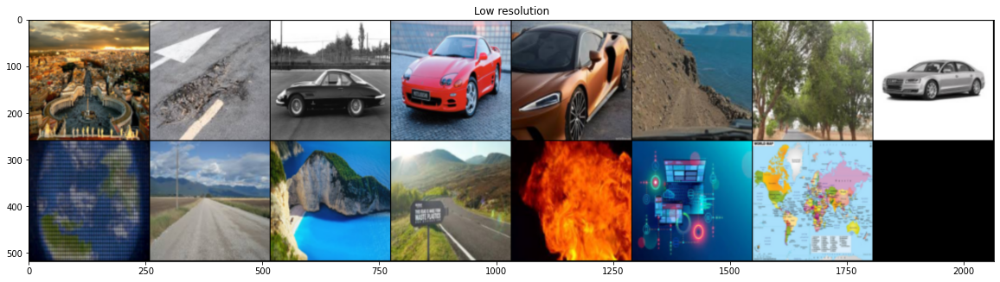

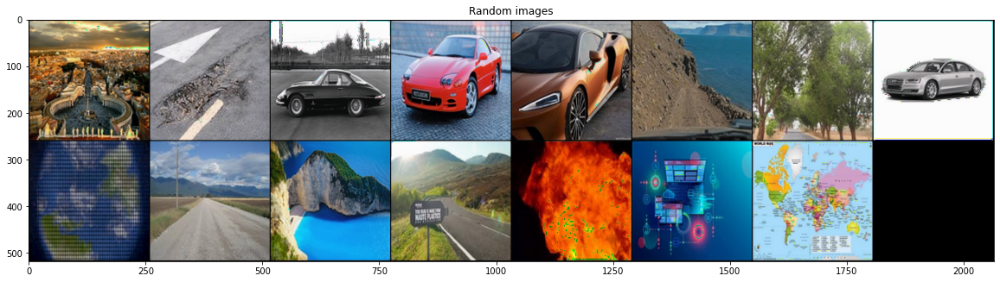

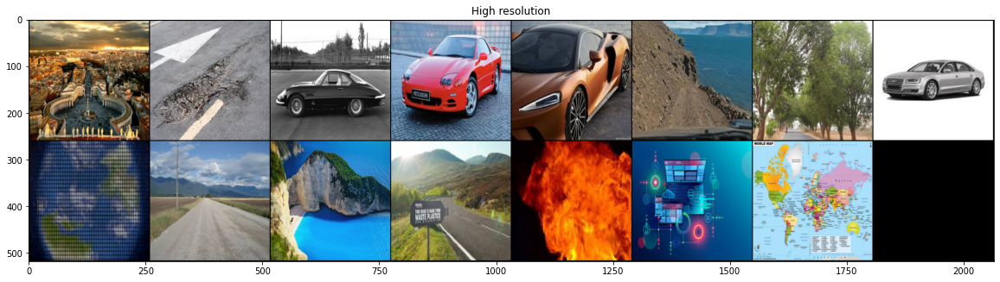

In [ ]:
image,label = iter(val_loader_lowres).next()
image1,label1 = iter(val_loader_highres).next()
image = image.to(device)
z,capas = autoencoder.encoder(image)
#z = z.to('cpu')

std, mean =  torch.std_mean(z, unbiased=False)
dims = (16, 512, 32, 32)
z1 = torch.randn(dims)
z1 = z1.to(device)
z1 = z1*std + mean

#z1 = z1.to(device)
random_decoded = autoencoder.decoder(z1, capas)
random_decoded = random_decoded.to('cpu')


fig, ax = plt.subplots(figsize=(20, 20))
Show_Weight(image[0:15], "Low resolution")
fig, ax = plt.subplots(figsize=(20, 20))
Show_Weight(random_decoded[0:15], "Random images")
fig, ax = plt.subplots(figsize=(20, 20))
Show_Weight(image1[0:15], "High resolution")

In [ ]:

with torch.no_grad():
  #z_output = torch.zeros(112, 512, 32, 32)
  #z_output = z_output.to(device)
  random_output = torch.zeros(112, 512, 32, 32)
  random_output = random_output.to(device)
  for i, (images,labels) in enumerate(val_loader_lowres):
    images = images.to(device)
    z,capas = autoencoder.encoder(images)
    
    #z = z_output.to('cpu')
    std, mean =  torch.std_mean(z, unbiased=False)
    print("Iter %d Standard deviation and mean: %f, %f" % (i, float(std),float(mean)))
    #print(float(std),float(mean))
    #dims = z.size()
    dims = (16, 512, 32, 32)
    z1 = torch.randn(dims)
    z1 = z1.to(device)
    z1 = z1*std + mean

    #print(z1.size(),capas[0].size())
    if int(capas[0].size()[0]) < 16 :
      # print(type(capas[0]))
      # print(type(z1))
      indices = torch.tensor(np.arange(7))#[0, 6])
      indices = indices.to(device)
      z1 = torch.index_select(z1, 0, indices)
      #print(z1.size(),capas[0].size())
      #z1 = data_utils.Subset(z1, (0,7))
    #img_train_high = data_utils.Subset(img_train, indices)
    random_decoded = autoencoder.decoder(z1, capas)
    random_decoded = random_decoded.to('cpu')

    if i==0:
      random_output = random_decoded
    else:
      random_output = torch.cat((random_output,random_decoded), dim=0)

    random_loader = torch.utils.data.DataLoader(dataset=z1, batch_size=16, shuffle=True)

print(len(random_output))


Iter 0 Standard deviation and mean: 0.000003, 0.000000
Iter 1 Standard deviation and mean: 0.000003, 0.000000
Iter 2 Standard deviation and mean: 0.000003, 0.000000
Iter 3 Standard deviation and mean: 0.000003, 0.000000
Iter 4 Standard deviation and mean: 0.000003, 0.000000
Iter 5 Standard deviation and mean: 0.000003, 0.000000
Iter 6 Standard deviation and mean: 0.000003, 0.000000
Iter 7 Standard deviation and mean: 0.000003, 0.000000
119


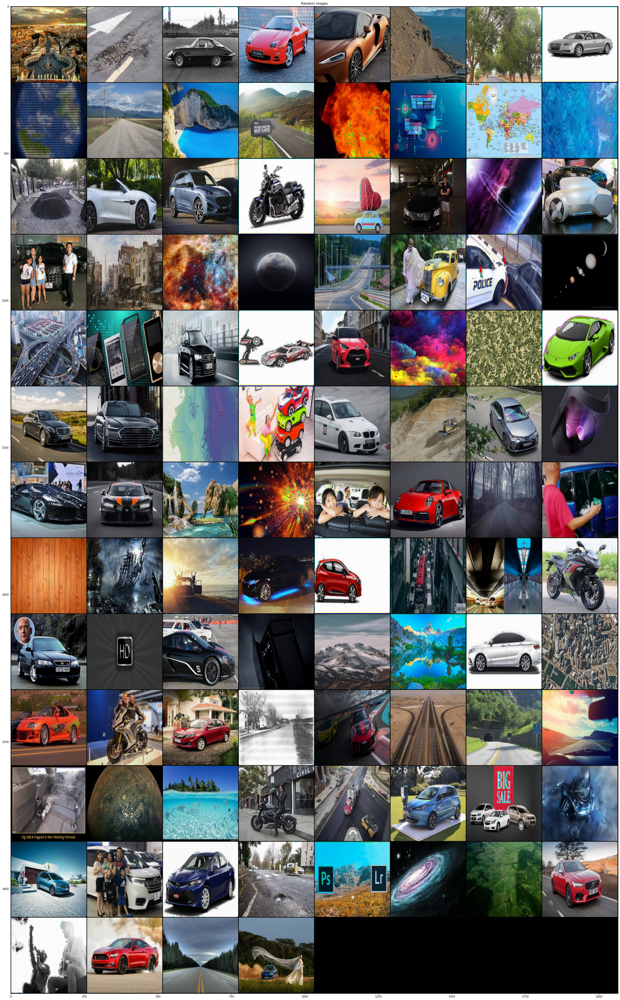

In [ ]:
# fig, ax = plt.subplots(figsize=(20, 20))
# Show_Weight(image[0:111], "Low resolution")
fig, ax = plt.subplots(figsize=(40, 100))
Show_Weight(random_output[0:100], "Random images")
# fig, ax = plt.subplots(figsize=(20, 20))
# Show_Weight(image1[8:13], "High resolution")
